Answer to weekly check-in:

One of the concepts we discussed last week was the concept of the hydrophobic-polar model, wherein only hydrophobic contacts have a negative energy in protein folding. I think it is interesting because the authors of this paper (Shan et al.) used the Born model to calculate the interaction energy between the protein and the ligand. The Born model (according to https://pubs.rsc.org/en/content/articlelanding/2020/cp/d0cp04148c#:~:text=The%20Born%20model%2C%20developed%20to,to%20solvate%20anions%20over%20cations) calculates the free energy of ions when solvated. It is almost the exact opposite of the hydrophobic-polar model, which I think is intriguing because it seems to ignore the hydrophobic-hydrophobic interaction energies, which you would expect there to be more of when considering organic molecules rather than just pure ions. Perhaps additional analyses could be run using something akin to a combination of the hydrophobic-polar model and the Born model to take into account both types of interaction energies to see if that could better explain some of the binding sites.

Also, another concept we discussed last week was the idea of the Monte Carlo simulation and how it is very difficult to use the Monte Carlo simulation with water solvent because of the high energies of movement. One of the (somewhat successful) attempted solutions to this problem is to do a step in the Monte Carlo simulation, accept that step, and then resolvate your molecule of interest in water like in an MD simulation. The paper only used MD simulations, and those revealed that there is an intermediate state where there is shell of water molecules that provides a kinetic barrier before each ligand is fully bound, and that the destruction of ths barrier is important. However, I wonder if it is possible to get the same results with protein binding if we used this hybrid Monte Carlo/MD model discussed in class. If it were possible to get the same results, then perhaps this water shell is less important of a intermediate than originally thought in this paper. The hybrid Monte Carlo/MD model essentially ignores water molecules during the movement of these proteins and molecules, so if we get the same result without this water shell acting as a kinetic barrier, then we may have discovered more about the mechanism of binding and how important certain steps are.

In [1]:
import mdtraj as md
import os
import sys
import numpy as np
import matplotlib.pyplot as plt
from matplotlib import colors
import math
from numpy import log2, zeros, mean, var, sum, loadtxt, arange, \
                  array, cumsum, dot, transpose, diagonal, floor
from numpy.linalg import inv, lstsq

https://figshare.com/articles/dataset/Microsecond_molecular_dynamics_simulation_of_kinase_domain_of_the_human_tyrosine_kinase_ABL1/4496795/1

This is a one microsecond trajectory of the catalytic domain of the human tyrosine protein kinase ABL1 (UNIPROT:ABL1_HUMAN, residues 242-493). The simulation was generated on Folding@home using OpenMM 6.3.1 with the AMBER99SB-ILDN forcefield, TIP3P water, and neutralizing salt. A Langevin integrator with 2 fs timestep, 300 K temperature, and 1/ps collision rate was used. PME with a nonbonded cutoff of 1.0 nm was used with default tolerance of 5.0e-4. A long-range isotropic dispersion correction was used to correct for the truncation of Lennard-Jones interactions at 1.0 nm. A molecular-scaling Monte Carlo barostat was applied using a 1 atm reference pressure, with MC moves attempted every 50 steps. Coordinates were saved every 250ps, and waters and ions stripped. The trajectory file contains 4000 snapshots. Initial models were generated with Ensembler (see References) using the ABL1 structure from chain B of PDB ID: 2GQG as a template.

https://www.rcsb.org/structure/2GQG

Trajetories and pdb can be downloaded here:
https://www.dropbox.com/s/qymy39ak2apqd75/ABL1.zip?dl=0


In [2]:
pdb='C:/Users/leman/Documents/CHEM101.6-96.6/Lab2_ProteinMD/ABL1/ABL1.pdb'
trajectory='C:/Users/leman/Documents/CHEM101.6-96.6/Lab2_ProteinMD/ABL1/ABL1.dcd'
outdir='C:/Users/leman/Documents/CHEM101.6-96.6/Lab2_ProteinMD/ABL1/output'
if not os.path.exists('outdir'):
    os.makedirs('outdir')
    
print("outdir:",outdir)
print("pdb:",pdb)
print("trjaectory:",trajectory)

outdir: C:/Users/leman/Documents/CHEM101.6-96.6/Lab2_ProteinMD/ABL1/output
pdb: C:/Users/leman/Documents/CHEM101.6-96.6/Lab2_ProteinMD/ABL1/ABL1.pdb
trjaectory: C:/Users/leman/Documents/CHEM101.6-96.6/Lab2_ProteinMD/ABL1/ABL1.dcd


In [3]:
trj = md.load(trajectory, top=pdb,stride=1)
trj.center_coordinates()
top = trj.topology
first_frame = 0
last_frame = trj.n_frames
n_frames=trj.n_frames

In [4]:
nres=[]
for res in trj.topology.residues: nres.append(res.resSeq)
sequence=(' %s' % [residue for residue in trj.topology.residues])
resname=(' %s' % [residue.name for residue in trj.topology.residues])
resindex=(' %s' % [residue.index for residue in trj.topology.residues])
res_num=(' %s' % [residue.resSeq  for residue in trj.topology.residues])



#log = open("/Users/paulrobustelli/Desktop/Sa_calc.log", "w")
print("** SYSTEM INFO **\n")
print("Number of atoms: %d\n" % trj.n_atoms)
print("Number of residues: %d\n" % len(set(nres)))
print("Number of frames: %d\n" % trj.n_frames)
print("Starting frame: %d\n" % first_frame)
print("Last frame: %d\n" % last_frame)
print("sequence: %s\n" % sequence)
print("residue names: %s\n" % resname)
print("residue number: %s\n" % res_num)
print("residue index: %s\n" % resindex)


** SYSTEM INFO **

Number of atoms: 4062

Number of residues: 252

Number of frames: 4000

Starting frame: 0

Last frame: 4000

sequence:  [ILE242, THR243, MET244, LYS245, HIS246, LYS247, LEU248, GLY249, GLY250, GLY251, GLN252, TYR253, GLY254, GLU255, VAL256, TYR257, GLU258, GLY259, VAL260, TRP261, LYS262, LYS263, TYR264, SER265, LEU266, THR267, VAL268, ALA269, VAL270, LYS271, THR272, LEU273, LYS274, GLU275, ASP276, THR277, MET278, GLU279, VAL280, GLU281, GLU282, PHE283, LEU284, LYS285, GLU286, ALA287, ALA288, VAL289, MET290, LYS291, GLU292, ILE293, LYS294, HIS295, PRO296, ASN297, LEU298, VAL299, GLN300, LEU301, LEU302, GLY303, VAL304, CYS305, THR306, ARG307, GLU308, PRO309, PRO310, PHE311, TYR312, ILE313, ILE314, THR315, GLU316, PHE317, MET318, THR319, TYR320, GLY321, ASN322, LEU323, LEU324, ASP325, TYR326, LEU327, ARG328, GLU329, CYS330, ASN331, ARG332, GLN333, GLU334, VAL335, ASN336, ALA337, VAL338, VAL339, LEU340, LEU341, TYR342, MET343, ALA344, THR345, GLN346, ILE347, SER348, SER3

In [5]:
residue_num=[]
for res in top.residues: 
    residue_num.append(res.resSeq)
residue_id=np.asarray(residue_num)
residue_id

array([242, 243, 244, 245, 246, 247, 248, 249, 250, 251, 252, 253, 254,
       255, 256, 257, 258, 259, 260, 261, 262, 263, 264, 265, 266, 267,
       268, 269, 270, 271, 272, 273, 274, 275, 276, 277, 278, 279, 280,
       281, 282, 283, 284, 285, 286, 287, 288, 289, 290, 291, 292, 293,
       294, 295, 296, 297, 298, 299, 300, 301, 302, 303, 304, 305, 306,
       307, 308, 309, 310, 311, 312, 313, 314, 315, 316, 317, 318, 319,
       320, 321, 322, 323, 324, 325, 326, 327, 328, 329, 330, 331, 332,
       333, 334, 335, 336, 337, 338, 339, 340, 341, 342, 343, 344, 345,
       346, 347, 348, 349, 350, 351, 352, 353, 354, 355, 356, 357, 358,
       359, 360, 361, 362, 363, 364, 365, 366, 367, 368, 369, 370, 371,
       372, 373, 374, 375, 376, 377, 378, 379, 380, 381, 382, 383, 384,
       385, 386, 387, 388, 389, 390, 391, 392, 393, 394, 395, 396, 397,
       398, 399, 400, 401, 402, 403, 404, 405, 406, 407, 408, 409, 410,
       411, 412, 413, 414, 415, 416, 417, 418, 419, 420, 421, 42

In [6]:
#Use DSSP to calculate the secondary structure definition
#https://mdtraj.org/1.9.4/api/generated/mdtraj.compute_dssp.html
dssp=md.compute_dssp(trj,simplified=True)
dssp

array([['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ['C', 'E', 'E', ..., 'H', 'C', 'C'],
       ['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ...,
       ['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ['C', 'E', 'E', ..., 'C', 'C', 'C'],
       ['C', 'E', 'E', ..., 'C', 'C', 'C']], dtype='<U2')

In [7]:
print(dssp.shape)
print("Rows:",len(dssp))
print("Columns:",len(dssp[0]))

#Print out helix and beta residues for a given frame
frame=0
dssp_frame=np.column_stack((residue_id,dssp[frame]))
helix_res=np.where(dssp_frame[:,1]=='H')
beta_res=np.where(dssp_frame[:,1]=='E')
print('helical residues:',dssp_frame[helix_res])
print('beta residues:',dssp_frame[beta_res])

(4000, 252)
Rows: 4000
Columns: 252
helical residues: [['280' 'H']
 ['281' 'H']
 ['282' 'H']
 ['283' 'H']
 ['284' 'H']
 ['285' 'H']
 ['286' 'H']
 ['287' 'H']
 ['288' 'H']
 ['289' 'H']
 ['323' 'H']
 ['324' 'H']
 ['325' 'H']
 ['326' 'H']
 ['327' 'H']
 ['337' 'H']
 ['338' 'H']
 ['339' 'H']
 ['340' 'H']
 ['341' 'H']
 ['342' 'H']
 ['343' 'H']
 ['344' 'H']
 ['345' 'H']
 ['346' 'H']
 ['347' 'H']
 ['348' 'H']
 ['349' 'H']
 ['350' 'H']
 ['351' 'H']
 ['352' 'H']
 ['353' 'H']
 ['354' 'H']
 ['355' 'H']
 ['356' 'H']
 ['357' 'H']
 ['366' 'H']
 ['367' 'H']
 ['368' 'H']
 ['373' 'H']
 ['374' 'H']
 ['375' 'H']
 ['403' 'H']
 ['404' 'H']
 ['405' 'H']
 ['408' 'H']
 ['409' 'H']
 ['410' 'H']
 ['411' 'H']
 ['412' 'H']
 ['413' 'H']
 ['420' 'H']
 ['421' 'H']
 ['422' 'H']
 ['423' 'H']
 ['424' 'H']
 ['425' 'H']
 ['426' 'H']
 ['427' 'H']
 ['428' 'H']
 ['429' 'H']
 ['430' 'H']
 ['431' 'H']
 ['432' 'H']
 ['433' 'H']
 ['449' 'H']
 ['450' 'H']
 ['451' 'H']
 ['452' 'H']
 ['453' 'H']
 ['466' 'H']
 ['467' 'H']
 ['468' 'H

(350, 400)

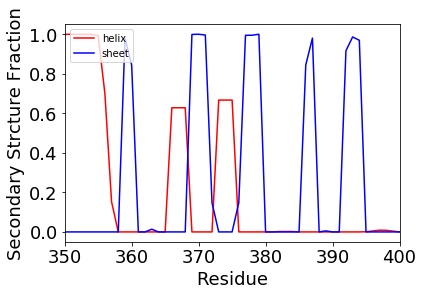

In [8]:
dssp=md.compute_dssp(trj,simplified=True)

def dssp_convert(dssp):
 dsspH=np.copy(dssp)
 dsspE=np.copy(dssp)
 dsspH[dsspH=='H']=1                                                                                      
 dsspH[dsspH=='E']=0                                                                                      
 dsspH[dsspH=='C']=0                                                                                      
 dsspH[dsspH=='NA']=0 
 dsspH=dsspH.astype(int)
 TotalH=np.sum(dsspH,axis=1) 
 Hprop=np.sum(dsspH,axis=0).astype(float)/len(dsspE) 

 dsspE[dsspE=='H']=0
 dsspE[dsspE=='E']=1
 dsspE[dsspE=='C']=0
 dsspE[dsspE=='NA']=0
 dsspE=dsspE.astype(int)
 TotalE=np.sum(dsspE,axis=1) 
 Eprop=np.sum(dsspE,axis=0).astype(float)/len(dsspE) 
 return Hprop, Eprop

Hprop,Eprop=dssp_convert(dssp)
plt.plot(residue_num,Hprop,c='r',label='helix')
plt.plot(residue_num,Eprop,c='b',label='sheet')

plt.legend(loc="upper left")
plt.xlabel('Residue', size=18)
plt.ylabel('Secondary Strcture Fraction', size=18)
plt.tick_params(labelsize=18)
plt.xlim(350,400)


***HOMEWORK Problem 1***

**Use the full DSSP set of secondary structure assignments to plot the population of another secondary structure type and visualize it with a representative frame or frames in VMD**

**Consult the original DSSP paper (or online documentaiton) to confirm the criteria for this assignment** 

Kabsch W, Sander C (1983). “Dictionary of protein secondary structure: pattern recognition of hydrogen-bonded and geometrical features”. Biopolymers 22 (12): 2577-637. doi:10.1002/bip.360221211

dssp=md.compute_dssp(trj,simplified=False)

https://mdtraj.org/1.9.4/api/generated/mdtraj.compute_dssp.html

The DSSP assignment codes are:

‘H’ : Alpha helix

‘B’ : Residue in isolated beta-bridge

‘E’ : Extended strand, participates in beta ladder

‘G’ : 3-helix (3/10 helix)

‘I’ : 5 helix (pi helix)

‘T’ : hydrogen bonded turn

‘S’ : bend

‘ ‘ : Loops and irregular elements

The simplified DSSP codes are:

‘H’ : Helix. Either of the ‘H’, ‘G’, or ‘I’ codes.

‘E’ : Strand. Either of the ‘E’, or ‘B’ codes.

‘C’ : Coil. Either of the ‘T’, ‘S’ or ‘ ‘ codes.

I residues: [409 410 411 412 413 449 450 451 452 453]


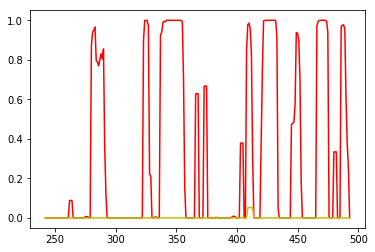

In [12]:
####HOMEWORK ######
#Use the full DSSP Definition and plot the population of another secondary structure type 
#https://mdtraj.org/1.9.4/api/generated/mdtraj.compute_dssp.html

dssp_full=md.compute_dssp(trj,simplified=False)

def dssp_convert_I(dssp_full):
 dsspI=np.copy(dssp_full)                                                                      
 dsspI[dsspI!='I']=0   
 dsspI[dsspI=='I']=1 
 dsspI=dsspI.astype(int)
 TotalI=np.sum(dsspI,axis=1) 
 Iprop=np.sum(dsspI,axis=0).astype(float)/len(dsspI)
 return Iprop

Iprop=dssp_convert_I(dssp_full)

plt.plot(residue_num,Hprop,c='r',label='helix')
plt.plot(residue_num,Iprop,c='y',label='5 helix')

I_residues=np.where(Iprop>0.0)
#print(dssp_full)
#print(I_residues)
#print(dssp_full[I_residues])
print("I residues:",residue_id[I_residues])

In [13]:
#Since residues 409-413 seem to spend a larger portion of their time in the I state,
#we shall look for those frames where they are.

#Find all the frames where residue 409 is I
residue_number=409
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
pi_helix_frames=np.where(dssp_full[:,array_index]=='I')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",pi_helix_frames)

#Find all the frames where residue 410 is I

residue_number=410
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
pi_helix_frames=np.where(dssp_full[:,array_index]=='I')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",pi_helix_frames)

#Find all the frames where residue 411 is I

residue_number=411
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
pi_helix_frames=np.where(dssp_full[:,array_index]=='I')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",pi_helix_frames)

#Find all the frames where residue 412 is I

residue_number=412
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
pi_helix_frames=np.where(dssp_full[:,array_index]=='I')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",pi_helix_frames)

#Find all the frames where residue 413 is I

residue_number=413
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
pi_helix_frames=np.where(dssp_full[:,array_index]=='I')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",pi_helix_frames)



409
Residue 409
helix_frames: (array([   0,    3,    4,    6,    7,    8,    9,   10,   11,   12,   13,
         14,   20,   21,   24,   26,   30,  184,  222,  232,  253,  264,
        265,  280,  286,  297,  365,  406,  415,  438,  454,  467,  479,
        481,  510,  511,  570,  634,  651,  697,  717,  736,  746,  751,
        752,  779,  793,  800,  819,  837,  843,  858,  884,  885,  898,
        940,  979, 1008, 1014, 1035, 1041, 1043, 1049, 1052, 1069, 1076,
       1097, 1103, 1130, 1155, 1166, 1169, 1180, 1181, 1194, 1265, 1267,
       1288, 1315, 1320, 1323, 1344, 1350, 1356, 1357, 1365, 1367, 1391,
       1394, 1400, 1414, 1418, 1421, 1438, 1443, 1444, 1448, 1493, 1503,
       1519, 1530, 1533, 1566, 1574, 1583, 1588, 1596, 1634, 1643, 1673,
       1679, 1713, 1739, 1781, 1785, 1806, 1821, 1824, 1827, 1838, 1839,
       1888, 1911, 1917, 1927, 1934, 1940, 2033, 2034, 2043, 2044, 2045,
       2052, 2060, 2098, 2123, 2128, 2131, 2135, 2149, 2159, 2199, 2210,
       2213, 2223, 2

pi-helix (orange highlight) in frame 14 formed from residues 409-413:


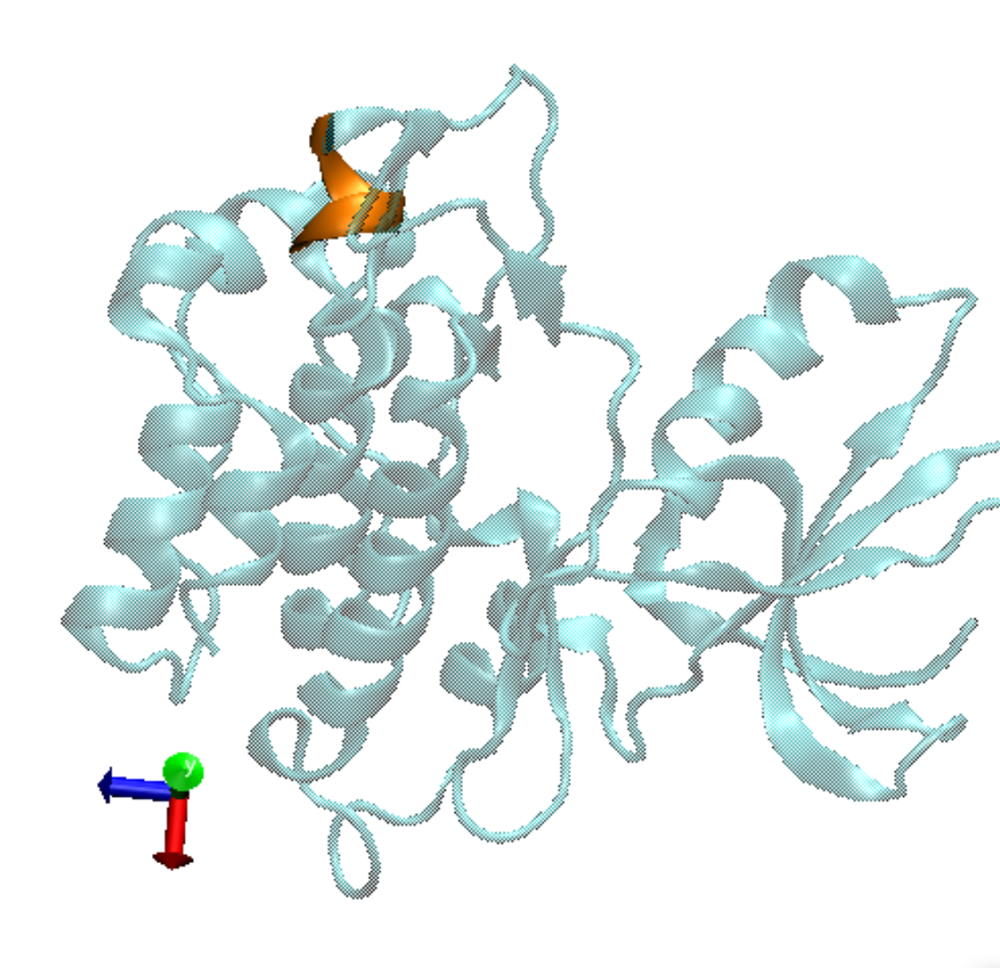

In [14]:
#Answer to question 1: According to Wikipedia, the main way to tell a pi helix 
#apart from other helices is the fact that it appears more "bulged" than normal 
#alpha helices. As we can clearly see when comparing this orange highlighted 
#pi-helix in frame 14, it is more "bulged" than the surrounding alpha helices. 
#Article link: https://en.wikipedia.org/wiki/Pi_helix
#A paper also calls pi-helices pi-bulges:
#https://febs.onlinelibrary.wiley.com/doi/full/10.1111/febs.13507
#Code to display images here as in the rest from:
#https://stackoverflow.com/questions/32370281/how-to-embed-image-or-picture-in-jupyter-notebook-either-from-a-local-machine-o

print("pi-helix (orange highlight) in frame 14 formed from residues 409-413:")
from IPython.display import Image
Image("Q1_frame_14.PNG")

Answer to question 1: According to Wikipedia, the main way to tell a pi helix apart from other helices is the fact that it appears more "bulged" than normal alpha helices. As we can clearly see when comparing this orange highlighted pi-helix in frame 14, it is more "bulged" than the surrounding alpha helices.
Article link: https://en.wikipedia.org/wiki/Pi_helix

A paper also calls pi-helices pi-bulges: https://febs.onlinelibrary.wiley.com/doi/full/10.1111/febs.13507

***Challenge Problem #1***

**Write function/efficient loop to calculate all secondary structure populations from the dssp_full definitions 
and write out all residues numbers with > 90% of each seondary structure type**

In [15]:
#### Challenge Problem Write a Function to Compute the Population of Any Secondary Structure Type
#### Write a loop to plot all populations
#### Write code to output the residue numbers of every residue with > 90% each SS type


***HOMEWORK Problem 2***

**Identify a residue that has a substantial population (>10%) of a second secondary structure assignment 
(for example something that is 50% helix/ 50% coil or 80% helix/ 20% coil) and make representative snapshots to illustrate the 2 conformations.  Can you identify any other structural changes in the vicinity of that residue that favor the 2nd conformation**

Array indices where helix prop is > 50%:  [ 38  39  40  41  42  43  44  45  46  47  48  81  82  83  84  85  95  96
  97  98  99 100 101 102 103 104 105 106 107 108 109 110 111 112 113 114
 124 125 126 131 132 133 166 167 168 169 170 179 180 181 182 183 184 185
 186 187 188 189 190 191 206 207 208 209 210 224 225 226 227 228 229 230
 231 232 233 244 245 246 247 248]
Residues where helix prop is > 50%:  [280 281 282 283 284 285 286 287 288 289 290 323 324 325 326 327 337 338
 339 340 341 342 343 344 345 346 347 348 349 350 351 352 353 354 355 356
 366 367 368 373 374 375 408 409 410 411 412 421 422 423 424 425 426 427
 428 429 430 431 432 433 448 449 450 451 452 466 467 468 469 470 471 472
 473 474 475 486 487 488 489 490]


(350, 400)

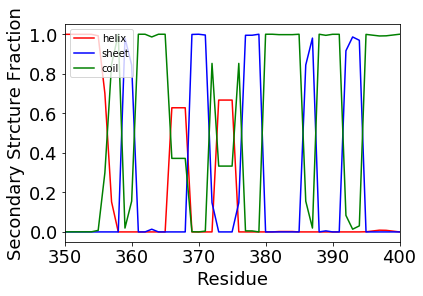

In [16]:
dssp=md.compute_dssp(trj,simplified=True)

def dssp_convert(dssp):
 dsspH=np.copy(dssp)
 dsspE=np.copy(dssp)
 dsspC=np.copy(dssp)
    
 dsspH[dsspH=='H']=1                                                                                      
 dsspH[dsspH=='E']=0                                                                                      
 dsspH[dsspH=='C']=0                                                                                      
 dsspH[dsspH=='NA']=0 
 dsspH=dsspH.astype(int)
 TotalH=np.sum(dsspH,axis=1) 
 Hprop=np.sum(dsspH,axis=0).astype(float)/len(dsspE) 

 dsspE[dsspE=='H']=0
 dsspE[dsspE=='E']=1
 dsspE[dsspE=='C']=0
 dsspE[dsspE=='NA']=0
 dsspE=dsspE.astype(int)
 TotalE=np.sum(dsspE,axis=1) 
 Eprop=np.sum(dsspE,axis=0).astype(float)/len(dsspE)
    
 dsspC[dsspC=='H']=0
 dsspC[dsspC=='E']=0
 dsspC[dsspC=='C']=1
 dsspC[dsspC=='NA']=0
 dsspC=dsspC.astype(int)
 TotalC=np.sum(dsspC,axis=1) 
 Cprop=np.sum(dsspC,axis=0).astype(float)/len(dsspC)
 
 return Hprop, Eprop, Cprop

Hprop,Eprop,Cprop=dssp_convert(dssp)
plt.plot(residue_num,Hprop,c='r',label='helix')
plt.plot(residue_num,Eprop,c='b',label='sheet')
plt.plot(residue_num,Cprop,c='g',label='coil')

Helix_residues=np.where(Hprop>0.5)
print("Array indices where helix prop is > 50%: ",Helix_residues[0])
Helix_res_id = Helix_residues[0] + 242
print("Residues where helix prop is > 50%: ",Helix_res_id)

plt.legend(loc="upper left")
plt.xlabel('Residue', size=18)
plt.ylabel('Secondary Strcture Fraction', size=18)
plt.tick_params(labelsize=18)
plt.xlim(350,400)

In [17]:
#From what we can see from what we printed out in terms of residues with
#populations of helices above 50% and from the graph above, it seems that
#residues 366-368 would be an ok choice for this question. I ended up choosing 367 but visualized all 3 for clarity. Now we have to find
#some frames.

#Find all the frames where residue 367 is H
residue_number=367
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
helix_frames=np.where(dssp[:,array_index]=='H')
coil_frames=np.where(dssp[:,array_index]=='C')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",helix_frames)
print("coil_frames:",coil_frames)

367
Residue 367
helix_frames: (array([   0,    1,    2, ..., 3997, 3998, 3999], dtype=int64),)
coil_frames: (array([  14,   33,   97, ..., 3973, 3991, 3995], dtype=int64),)


Helix (orange highlight) in frame 0 formed from residues 366-368:


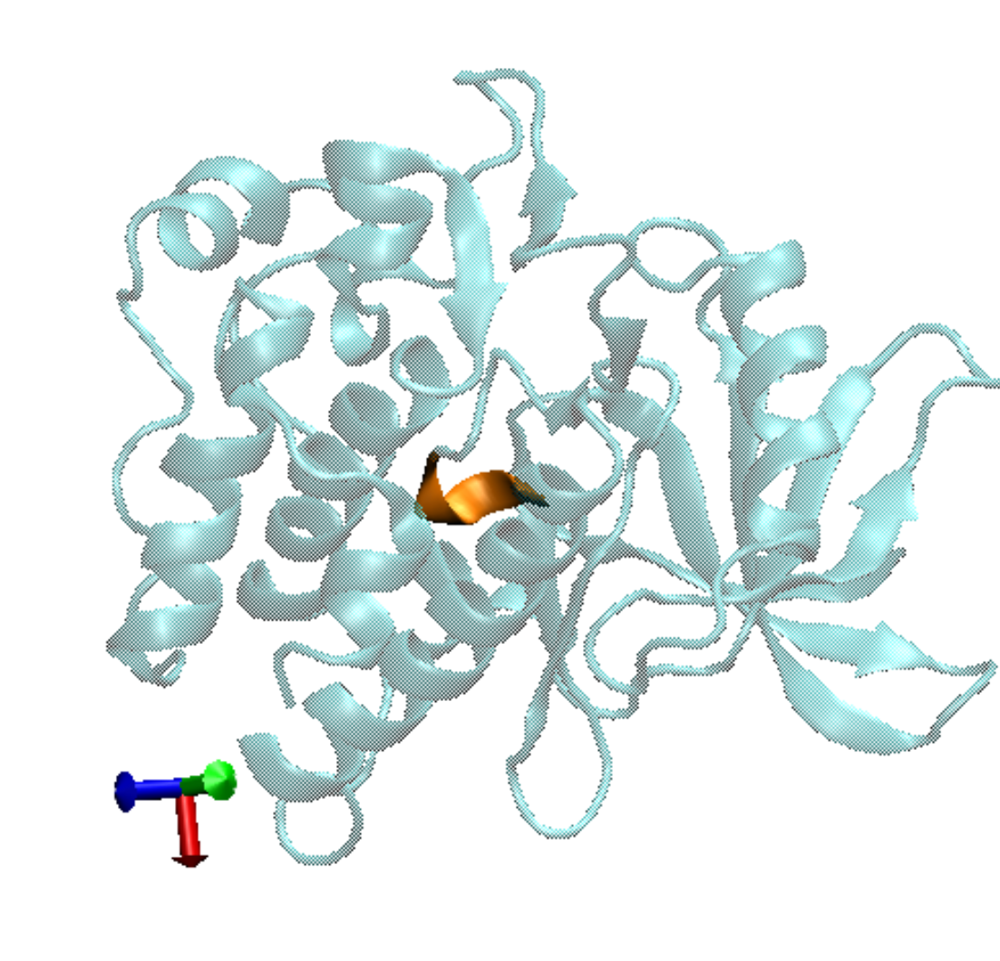

In [18]:
#Answer to question 2: From the images of the two, we can see that in frame 0, 
#when these residues are considered a part of a helix, the protein is more 
#compressed. However, in frame 14, when these residues are considered a part of 
#a coil, we can see that the protein is more stretched out. It seems that the 
#secondary structure these residues make up is barely a helix in the first place, 
#and a minor disturbance in the overall shape of the protein can cause it to 
#stretch out and lose its status as a helix, becoming a coil.

print("Helix (orange highlight) in frame 0 formed from residues 366-368:")
Image("Q2_frame_0_helix.PNG")

Coil (orange highlight) in frame 14 formed from residues 366-368:


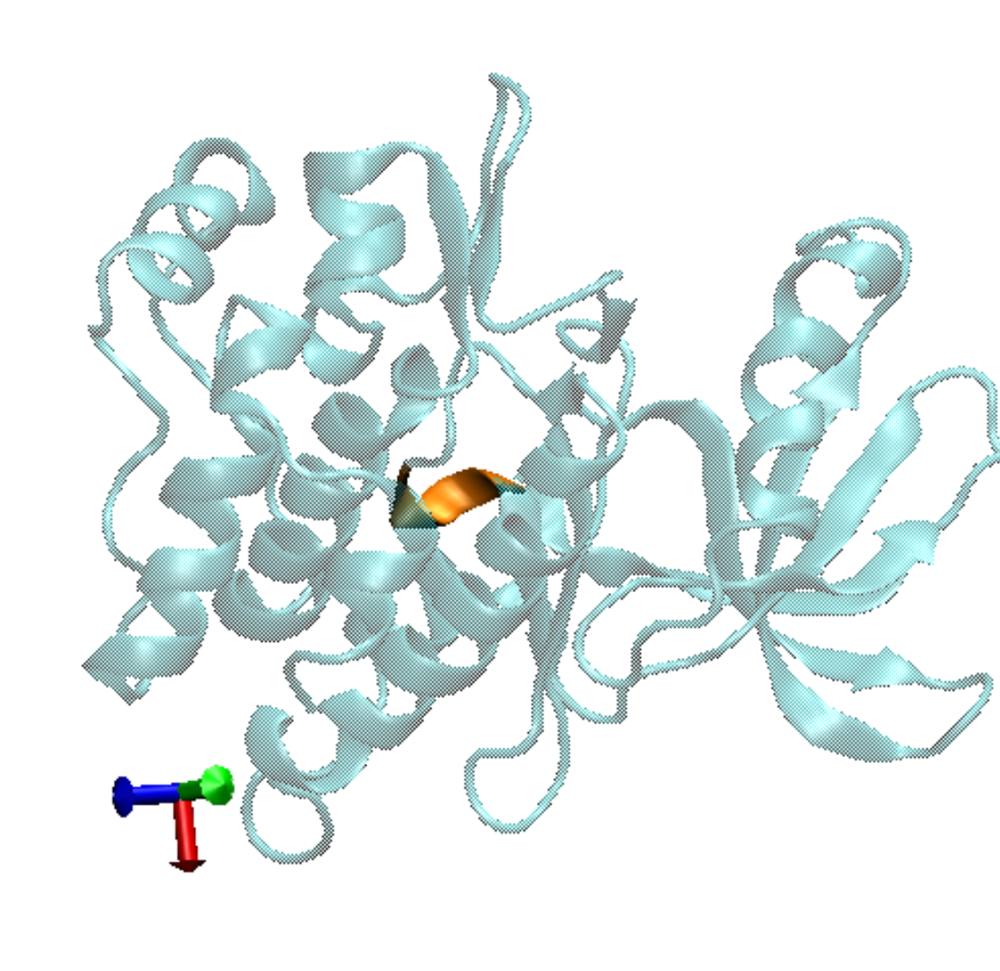

In [19]:
print("Coil (orange highlight) in frame 14 formed from residues 366-368:")
Image("Q2_frame_14_coil.PNG")

Answer to question 2: From the images of the two, we can see that in frame 0, when these residues are considered a part of a helix, the protein is more compressed. However, in frame 14, when these residues are considered a part of a coil, we can see that the protein is more stretched out. It seems that the secondary structure these residues make up is barely a helix in the first place, and a minor disturbance in the overall shape of the protein can cause it to stretch out and lose its status as a helix, becoming a coil.

In [20]:
#Find all the frames where a given residue is H or E
residue_number=340
array_index=residue_number-242
print(np.asarray(residue_num)[array_index])
helix_frames=np.where(dssp[:,array_index]=='H')
beta_frames=np.where(dssp[:,array_index]=='E')

print("Residue %s"%np.asarray(residue_num)[array_index])
print("helix_frames:",helix_frames)
print("helix_frames:",beta_frames)

340
Residue 340
helix_frames: (array([   0,    1,    2, ..., 3997, 3998, 3999], dtype=int64),)
helix_frames: (array([], dtype=int64),)


In [21]:
indices_phi, phis = md.compute_phi(trj)
indices_psi, psis = md.compute_psi(trj)
indices_chi1, chi1s = md.compute_chi1(trj)
indices_chi2, chi2s = md.compute_chi2(trj)

In [22]:
np.shape(phis[:,0])

(4000,)

In [23]:
phi_dict={}
dihedral_dict = { 'phi': { },
          'psi': { },
          'chi1': { },
          'chi2': { }}

for i in range(0,len(indices_phi)):
  indices=indices_phi[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['phi'][resnum]=phis[:,i]

for i in range(0,len(indices_psi)):
  indices=indices_psi[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['psi'][resnum]=psis[:,i]

for i in range(0,len(indices_chi1)):
  indices=indices_chi1[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['chi1'][resnum]=chi1s[:,i]

for i in range(0,len(indices_chi2)):
  indices=indices_chi2[i]
  atom=top.atom(indices[1])
  resnum=top.atom(indices[1]).residue.resSeq
  dihedral_dict['chi2'][resnum]=chi2s[:,i]

In [24]:
sequence

' [ILE242, THR243, MET244, LYS245, HIS246, LYS247, LEU248, GLY249, GLY250, GLY251, GLN252, TYR253, GLY254, GLU255, VAL256, TYR257, GLU258, GLY259, VAL260, TRP261, LYS262, LYS263, TYR264, SER265, LEU266, THR267, VAL268, ALA269, VAL270, LYS271, THR272, LEU273, LYS274, GLU275, ASP276, THR277, MET278, GLU279, VAL280, GLU281, GLU282, PHE283, LEU284, LYS285, GLU286, ALA287, ALA288, VAL289, MET290, LYS291, GLU292, ILE293, LYS294, HIS295, PRO296, ASN297, LEU298, VAL299, GLN300, LEU301, LEU302, GLY303, VAL304, CYS305, THR306, ARG307, GLU308, PRO309, PRO310, PHE311, TYR312, ILE313, ILE314, THR315, GLU316, PHE317, MET318, THR319, TYR320, GLY321, ASN322, LEU323, LEU324, ASP325, TYR326, LEU327, ARG328, GLU329, CYS330, ASN331, ARG332, GLN333, GLU334, VAL335, ASN336, ALA337, VAL338, VAL339, LEU340, LEU341, TYR342, MET343, ALA344, THR345, GLN346, ILE347, SER348, SER349, ALA350, MET351, GLU352, TYR353, LEU354, GLU355, LYS356, LYS357, ASN358, PHE359, ILE360, HIS361, ARG362, ASP363, LEU364, ALA365, ALA36

In [25]:
#Heres a function to plot a phi/psi ramachandran plot:

def plot_phipsi(res):
 plt.hist2d(dihedral_dict['phi'][res],dihedral_dict['psi'][res],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
 plt.xlabel('$\phi$', size=18)
 plt.ylabel('$\psi$', size=18)
 plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
 plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
 plt.tick_params(labelsize=18)
 plt.show()
 return

def plot_chi(res):
    if res in dihedral_dict['chi1']:
     plt.hist(dihedral_dict['chi1'][res],bins=36,range=[-3.14,3.14])        
     plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
     plt.xlabel('$\chi_1$', size=18)
     plt.ylabel('counts', size=18)
     plt.tick_params(labelsize=18)
     plt.show()
     plt.clf()   
    if res in dihedral_dict['chi2']:
    #extra code to plot chi2 histogram
     plt.hist(dihedral_dict['chi2'][res],bins=36,range=[-3.14,3.14])        
     plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
     plt.xlabel('$\chi_2$', size=18)
     plt.ylabel('counts', size=18)
     plt.tick_params(labelsize=18)
     plt.show()
     plt.clf()
    
     plt.hist2d(dihedral_dict['chi1'][res],dihedral_dict['chi2'][res],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
     plt.xlabel('$\chi_1$', size=18)
     plt.ylabel('$\chi_2$', size=18)
     plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
     plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
     plt.tick_params(labelsize=18)
     plt.show()
    return




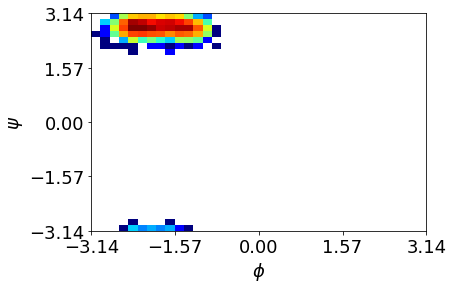

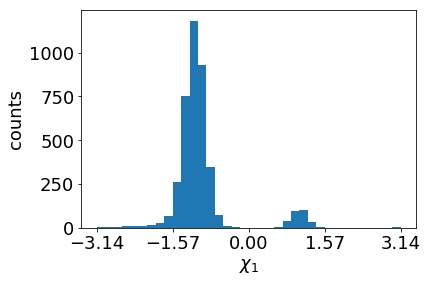

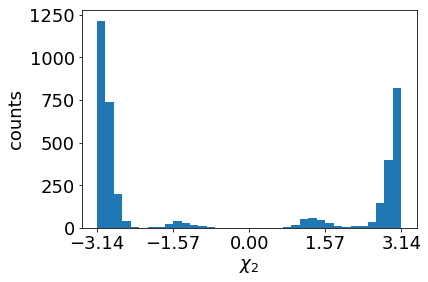

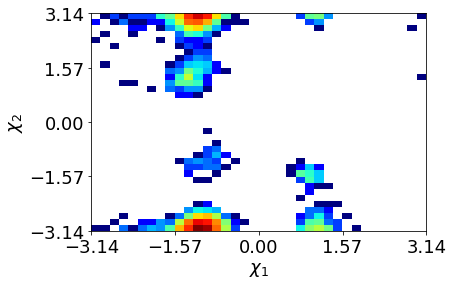

In [26]:
plot_phipsi(308)
plt.clf()
plot_chi(308)

In [27]:
#Lets Visualize Some Rotamers
#Lets Find all the VAL residues and plot thier X1 values
CA_sel=top.select('name CA')
resnames=[]
resnums=[]
for i in CA_sel:
 resnum=top.atom(i).residue.resSeq
 resnums.append(resnum)
 resname=top.atom(i).residue.name
 resnames.append(resname)

resnums=np.asarray(resnums)
resnames=np.asarray(resnames)
VAL_indices=np.where(resnames=='VAL')
Val_resnums=resnums[VAL_indices]
Val_resnums

array([256, 260, 268, 270, 280, 289, 299, 304, 335, 338, 339, 371, 377,
       379, 422, 427, 448, 468])

In [1]:
#This also makes it take a while to render
#for i in Val_resnums:
#    print("Residue",i)
#    plot_phipsi(i)
#    plt.clf()
#    plot_chi(i)
#    plt.clf()

***HOMEWORK Problem 3***

**Identify a residue that has 2 rotameric states and make representative snapshots to illustrate the 2 conformations (or a single snapshot with an overlay of two representative conformations).  Can you identify any other structural changes in the vicinity of that residue that favor the 2nd conformation.  Make a plot of the Chi 1 histogram (or Chi1/Chi2 if the residue has a Chi2 degree of freedom) and add a marking to the plot to indicate the dihedrals shown in your snapshot**



Scatter Plot of 384
[0.00000000e+00 1.00025006e+00 2.00050013e+00 ... 3.99799950e+03
 3.99899975e+03 4.00000000e+03]
4000
[-0.9875498 -1.6275562 -1.0344135 ... -1.2762775 -1.0979424 -2.0515792]
4000


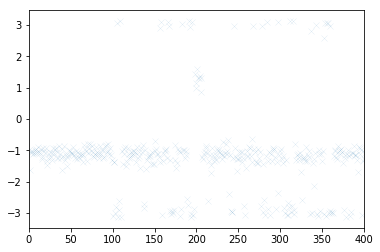

frame 111 -3.132935
frame 112 -1.033933


<Figure size 432x288 with 0 Axes>

In [28]:
#I chose leucine.
#LEU_indices=np.where(resnames=='LEU')
#Leu_resnums=resnums[LEU_indices]
#print(Leu_resnums)

#for i in Leu_resnums:
#    print("Residue",i)
#    plot_phipsi(i)
#    plt.clf()
#    plot_chi(i)
#    plt.clf()

#I modified the original code to print the chi2 angle as a histogram in the plotting functions above.
#Residue 384 seemed to be a good choice. There do seem to be 3 rotamers, but there are actually 2 since the angle just
#wraps back around. Let's look at that one. 
#First, let's plot the chi1 angle vs the frames to find some frames where there are changes between the rotamers 
#and then visualize them as a scatter plot.

print("Scatter Plot of 384")
frames_array = np.linspace(0,n_frames,num=n_frames)
print(frames_array)
print(frames_array.size)
print(dihedral_dict['chi1'][384])
print(dihedral_dict['chi1'][384].size)
plt.scatter(frames_array,dihedral_dict['chi1'][384],marker='x',linewidth=0.05)
plt.xlim(0,400)
plt.show()
plt.clf()

#We can see that transitions are pretty commonplace, so let's just visualize this in VMD. We can find some transitions 
#between frames 111 and 112. 

#Frame indices seem to be 1 off. Print to compare frames 111 and 112.
print('frame 111',dihedral_dict['chi1'][384][110])
print('frame 112',dihedral_dict['chi1'][384][111])
#We can see the chi1 angles between the two frames have drastically changed.

residue 384


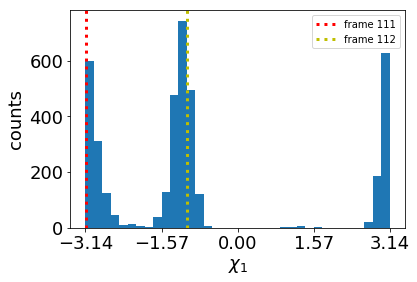

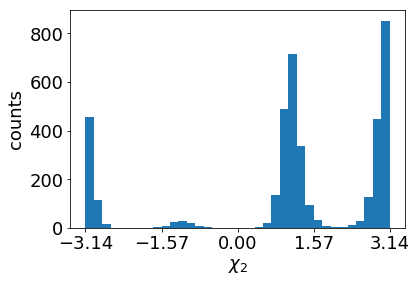

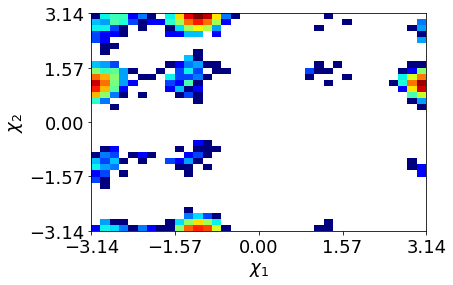

<Figure size 432x288 with 0 Axes>

In [29]:

res=384
print("residue",res)
plt.hist(dihedral_dict['chi1'][res],bins=36,range=[-3.14,3.14])        
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.xlabel('$\chi_1$', size=18)
plt.ylabel('counts', size=18)
plt.tick_params(labelsize=18)
#code to mark histogram from https://pythonguides.com/draw-vertical-line-matplotlib/
plt.axvline(dihedral_dict['chi1'][384][110],color='r',linestyle='dotted',linewidth=3,label='frame 111')
plt.axvline(dihedral_dict['chi1'][384][111],color='y',linestyle='dotted',linewidth=3,label='frame 112')
plt.legend()
plt.show()
plt.clf()  

plt.hist(dihedral_dict['chi2'][res],bins=36,range=[-3.14,3.14])        
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.xlabel('$\chi_2$', size=18)
plt.ylabel('counts', size=18)
plt.tick_params(labelsize=18)
plt.show()
plt.clf()

plt.hist2d(dihedral_dict['chi1'][res],dihedral_dict['chi2'][res],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
plt.xlabel('$\chi_1$', size=18)
plt.ylabel('$\chi_2$', size=18)
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.tick_params(labelsize=18)
plt.show()
plt.clf()

Residue 384 (orange) in frame 111:


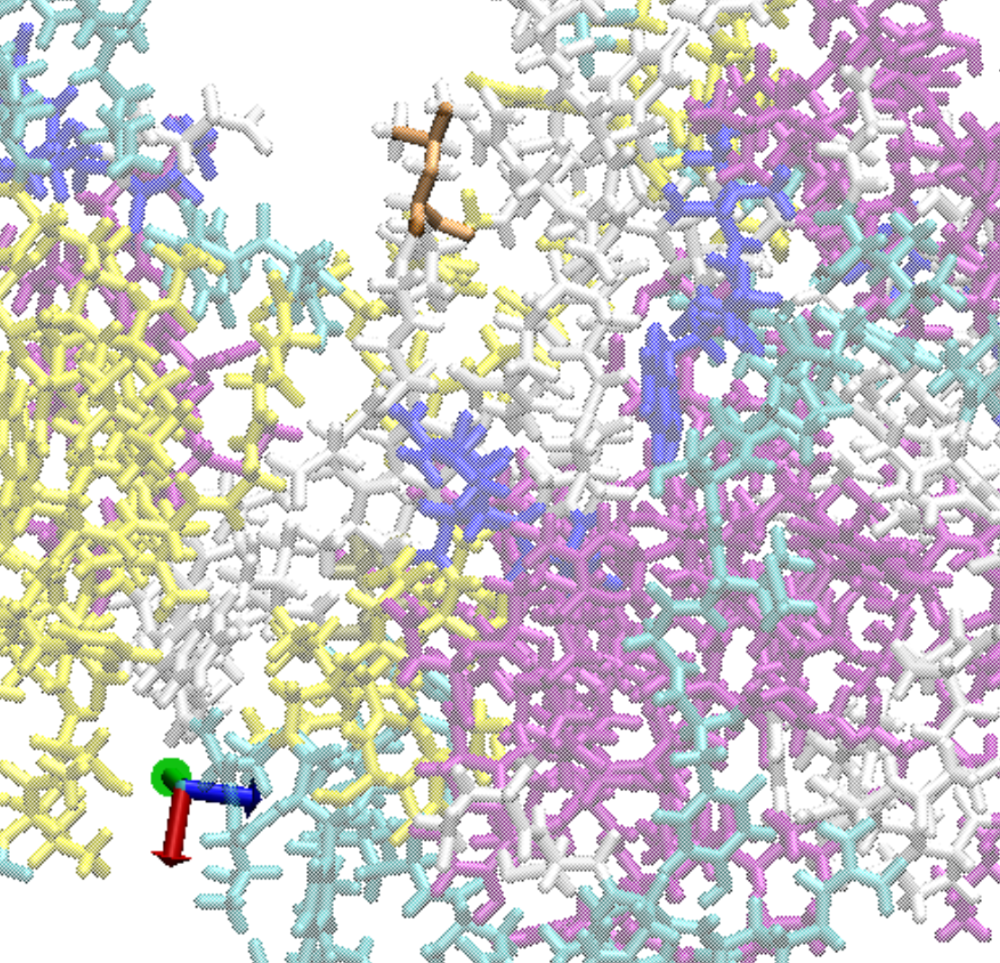

In [30]:
#Answer to question 3: We can see this amino acid marked in orange. These transitions likely stem from the the nearby groups
#(the white amino acids on the right side of the images) moving closer to our amino acid of interest
#and making a certain chi1 angle sterically unfavorable, which causes it to turn away and reduce the steric repulsion,
#resulting in a second chi1 angle.

print("Residue 384 (orange) in frame 111:")
Image("Q3_frame_111.PNG")

Residue 384 (orange) in frame 112:


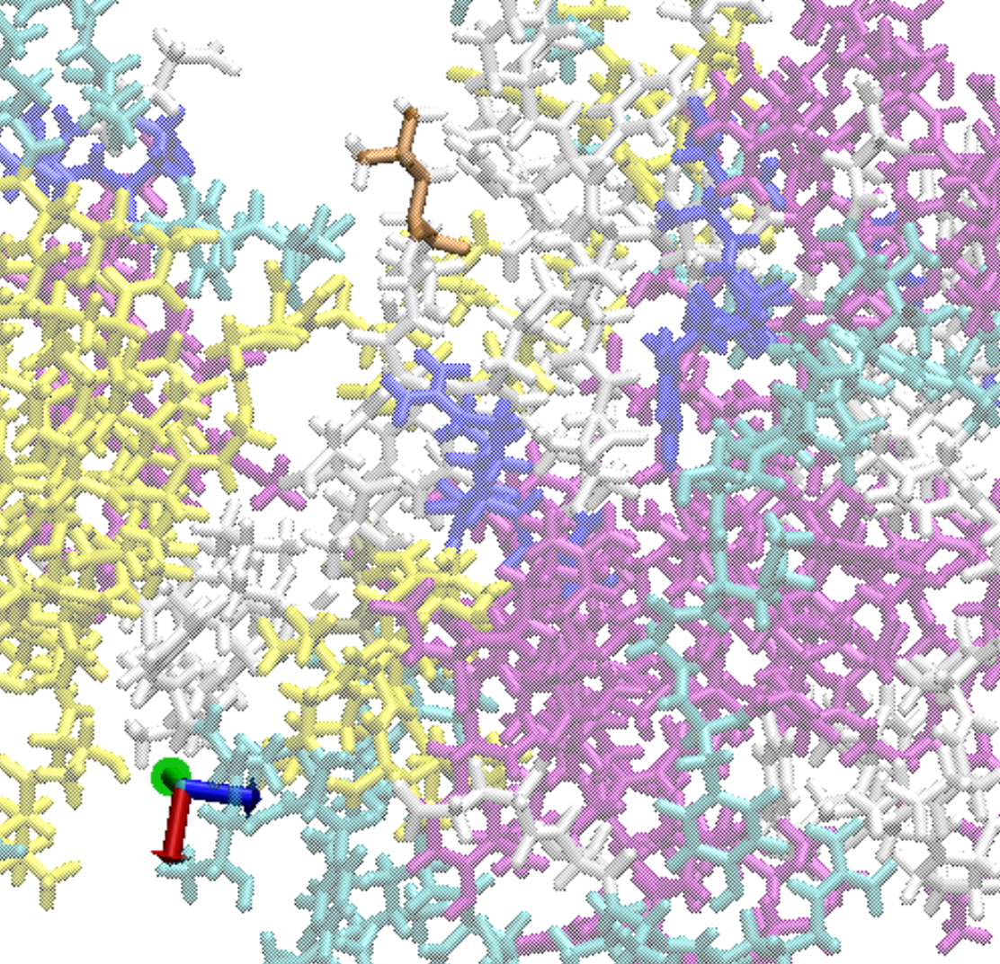

In [31]:
print("Residue 384 (orange) in frame 112:")
Image("Q3_frame_112.PNG")

Answer to question 3: We can see this amino acid marked in orange. These transitions likely stem from the the nearby groups (the white amino acids on the right side of the images) moving closer to our amino acid of interest and making a certain chi1 angle sterically unfavorable, which causes it to turn away and reduce the steric repulsion, resulting in a second chi1 angle.



***HOMEWORK Problem 4***

**Identify a residue that has 2 phi/psi free energy minima states and make representative snapshots to illustrate representative conformations (or a single snapshot with an overlay of two representative conformations).  Can you identify any other structural changes in the vicinity of that residue that favor the 2nd conformation.  Make a plot of the phi/psi histograms and add marking to the plot to indicate the phi/psi angles shown in your snapshot**

residue:  364
[[-2.1494498   0.3546672 ]
 [-2.3805141   0.72789925]
 [-2.548113    0.0733636 ]
 ...
 [-2.7649064   2.1124902 ]
 [-2.8227239   2.2447193 ]
 [-2.4432795   1.7556413 ]]
basin 1
(array([  20,   28,   33,   36,   62,   63,   64,   65,   66,   67,   68,
         69,   70,   71,   72,   73,   74,   75,   76,   77,   78,   79,
         80,   81,   82,   83,   84,   85,   86,   87,   88,   89,   90,
         91,   92,   93,   94,   95,   96,   97,   98,   99,  100,  101,
        102,  103,  104,  105,  106,  107,  108,  109,  110,  111,  112,
        113,  114,  115,  116,  117,  118,  119,  120,  121,  122,  123,
        124,  125,  126,  127,  128,  129,  130,  131,  132,  133,  134,
        135,  136,  137,  138,  139,  140,  141,  142,  143,  144,  145,
        146,  147,  148,  149,  150,  151,  152,  153,  154,  155,  156,
        157,  158,  159,  160,  161,  162,  163,  164,  165,  166,  167,
        168,  169,  170,  172,  173,  174,  175,  177,  178,  179,  180,
      

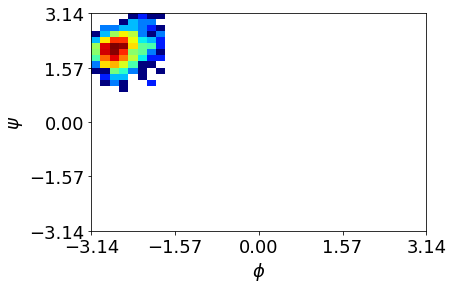

basin 2
(array([  41,  176,  192, ..., 3326, 3327, 3328], dtype=int64),)


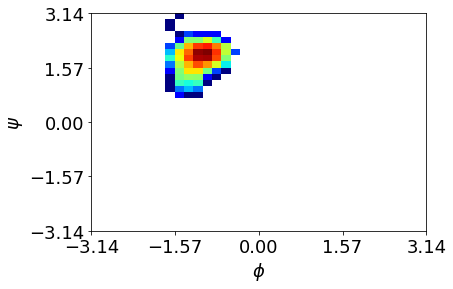

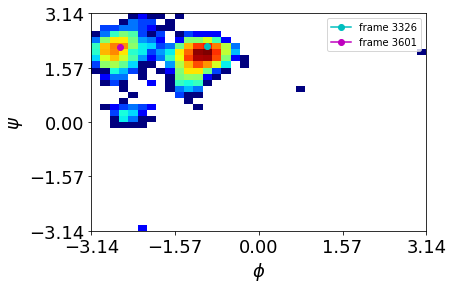

<Figure size 432x288 with 0 Axes>

In [32]:
res=364
print("residue: ",res)
phipsi_364=np.column_stack((dihedral_dict['phi'][res],dihedral_dict['psi'][res]))
print(phipsi_364)
basin1=np.where((phipsi_364[:,0]<-1.8) & (phipsi_364[:,1]>0.75))
#We can get some representative frames by inspecting what we print.
print('basin 1')
print(basin1)
#plt.hist2d(x=phipsi_364[basin1][:,0],y=phipsi_364[basin1][:,1])
plt.hist2d(dihedral_dict['phi'][res][basin1],dihedral_dict['psi'][res][basin1],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
plt.xlabel('$\phi$', size=18)
plt.ylabel('$\psi$', size=18)
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.tick_params(labelsize=18)
plt.show()
plt.clf()

print('basin 2')
basin2=np.where((phipsi_364[:,0]>-1.7) & (phipsi_364[:,0]<-0.5) & (phipsi_364[:,1]>0.75))
#We can get some representative frames by inspecting what we print.
print(basin2)
#plt.hist2d(x=phipsi_364[basin1][:,0],y=phipsi_364[basin1][:,1])
plt.hist2d(dihedral_dict['phi'][res][basin2],dihedral_dict['psi'][res][basin2],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
plt.xlabel('$\phi$', size=18)
plt.ylabel('$\psi$', size=18)
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.tick_params(labelsize=18)
plt.show()
plt.clf()

#From the arrays that contain the frames for the free energy basins, we can
#pick a few frames to take snapshots of. In this case, I will choose
#frame 3326 for basin 2 and frame 3601 for basin 1. These seem to fall squarely
#near the centers of their basins so seem to be good picks.
#Recall that the frames are 1 more than the index as we saw earlier.

#Got code for marking diagram from http://how.okpedia.org/en/python/how-to-draw-a-point-on-the-python-graph

plt.hist2d(dihedral_dict['phi'][res],dihedral_dict['psi'][res],bins=36,range=[[-3.14,3.14],[-3.14,3.14]], norm=colors.LogNorm(),cmap='jet')
plt.xlabel('$\phi$', size=18)
plt.ylabel('$\psi$', size=18)
plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
plt.tick_params(labelsize=18)
plt.plot(dihedral_dict['phi'][res][3325],dihedral_dict['psi'][res][3325], marker="o", color="c", label="frame 3326")
plt.plot(dihedral_dict['phi'][res][3600],dihedral_dict['psi'][res][3600], marker="o", color="m", label="frame 3601")
plt.legend()
plt.show()
plt.clf()

Residue 364 (orange) in frame 3326:


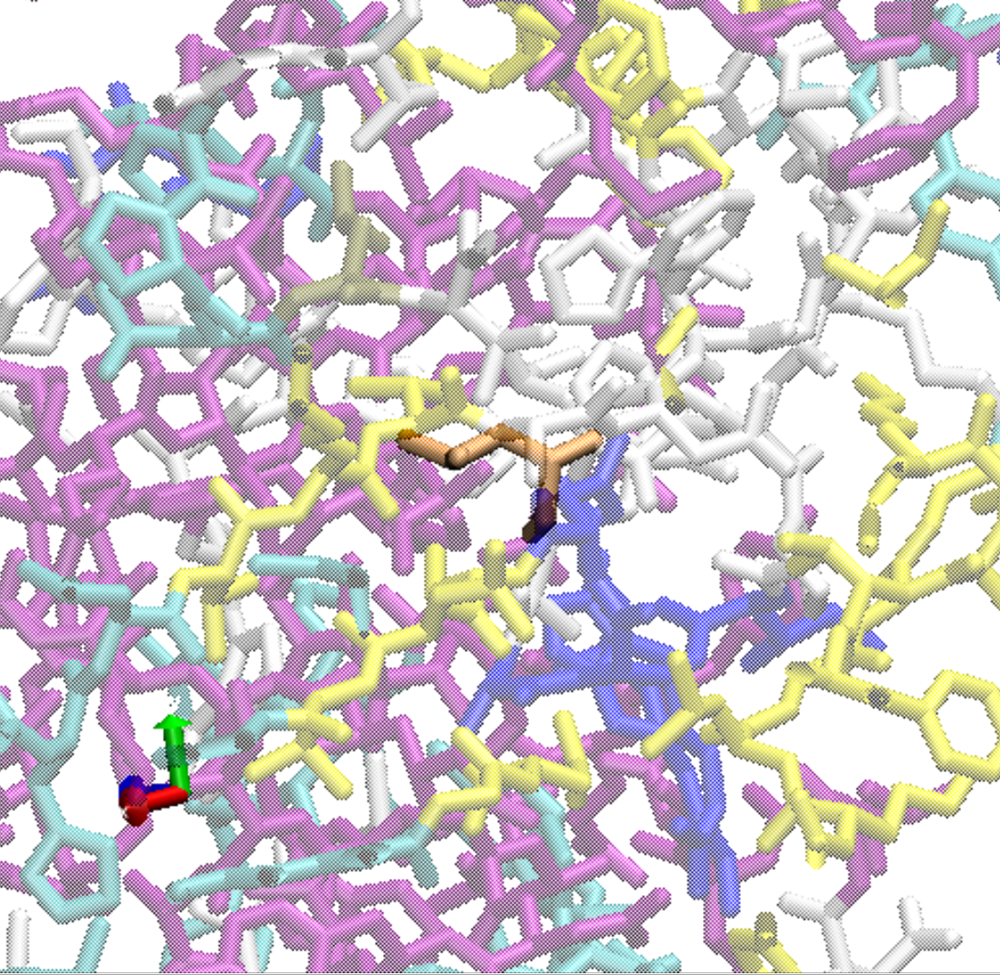

In [33]:
#Answer to question 4: To answer why the conformation of frame 3326 is more favored than frame 3601,
#(i.e., a deeper energy basin), compare the two VMD images below from the two 
#frames. It seems that in frame 3326, the leucine is less pushed outwards towards
#the mostly empty space in the center of the protein and will have less steric
#interactions with other amino acids.

print("Residue 364 (orange) in frame 3326:")
Image("Q4_frame_3326_1.PNG")

Residue 364 (orange) in frame 3601:


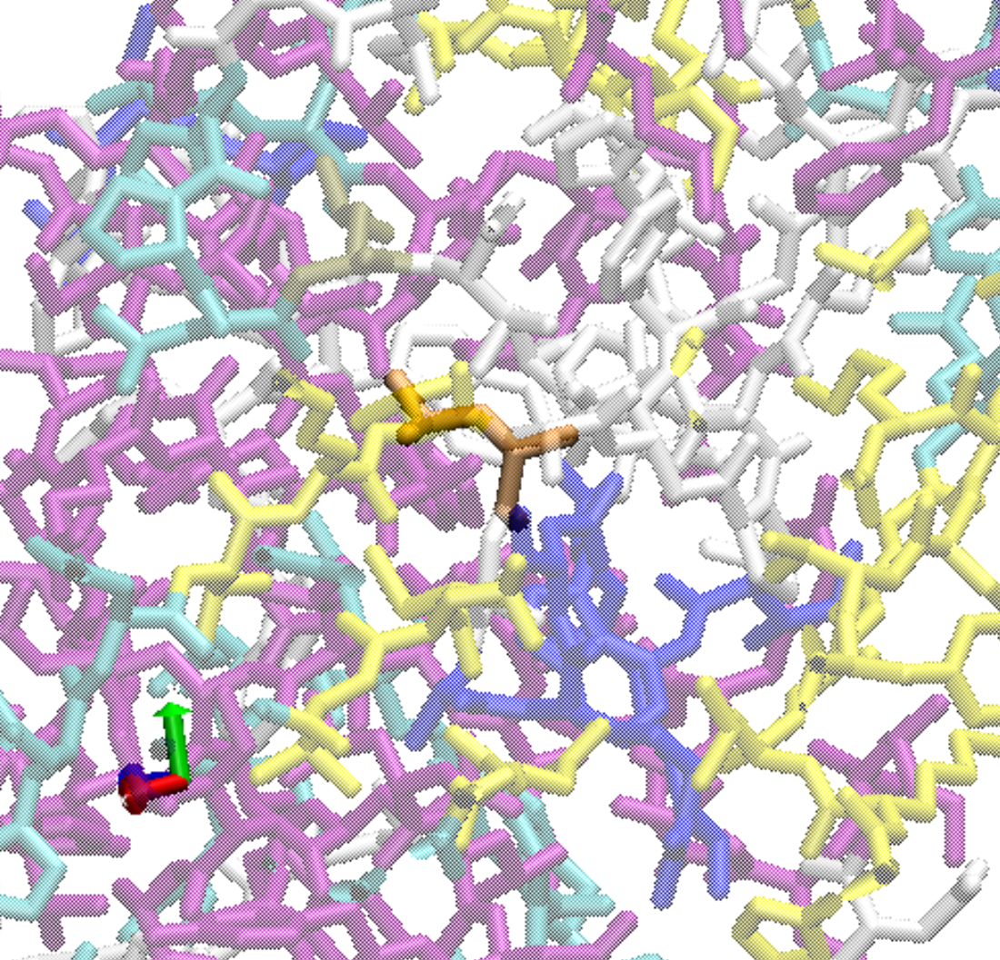

In [34]:
print("Residue 364 (orange) in frame 3601:")
Image("Q4_frame_3601_1.PNG")

***Challenge Problem 2***

**Identify a residue with phi/psi basins that favor distinct rotamers and make a plot of chi distributions for different regions of the phi/psi basins**


C:\Users\leman\Anaconda3\lib\site-packages\matplotlib\cbook\deprecation.py:107: MatplotlibDeprecationWarning: Using pyplot.axes(ax) with ax an Axes argument is deprecated. Please use pyplot.sca(ax) instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


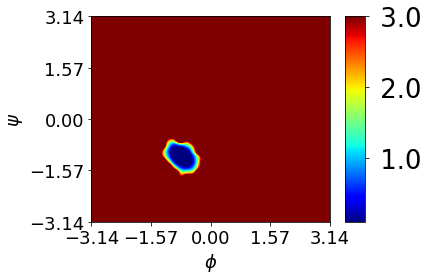

In [35]:
#Lets Make A Pretty Free Energy Plot 

def plot_phipsi_FES(res):
 free_energy,xedges,yedges=np.histogram2d(dihedral_dict['phi'][res],dihedral_dict['psi'][res],36,[[-3.14,3.14],[-3.14,3.14]],normed=True,weights=None)
 free_energy=np.log(np.flipud(free_energy)+.000001)
 T=300                                                                                                  
 kbT=T*0.008314/4.184 # kT in kcal/mol
 dG=-(kbT)*free_energy #Convert to kcal/mol
 im=plt.imshow(dG, interpolation='gaussian',extent=[yedges[0], yedges[-1], xedges[0], xedges[-1]],cmap='jet',aspect='auto')
 cbar_ticks=[0,1,2,3]
 cb = plt.colorbar(ticks=cbar_ticks, format=('% .1f'), aspect=10) # grab the Colorbar instance
 imaxes = plt.gca()                                                                                                 
 plt.xticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
 plt.yticks([-3.14,-3.14/2,0,3.14/2,3.14],fontsize=35)
 plt.xlabel('$\phi$', size=18)
 plt.ylabel('$\psi$', size=18)
 plt.tick_params(labelsize=18)
 plt.axes(cb.ax)
 plt.clim(vmin=0.1,vmax=3.0)
 plt.yticks(size='26')
 plt.tight_layout()
 plt.show()
 return

plot_phipsi_FES(350)